# **Stellar classification**


# **Introduction**
---
Data source: https://www.kaggle.com/datasets/fedesoriano/stellar-classification-dataset-sdss17/data \
The dataset contains observations made by the Sloan Digital Sky Survey and provides information on galaxies, stars and quasars.

---
The aim of this project is to select a classification model using machine learning techniques that will be able to accurately predict the class of new space objects based on their attributes. Through thorough exploratory data analysis and the use of various classification algorithms, we want to achieve optimal predictions. Classifying such data can help us in astronomical research that can contribute to a better understanding of the universe.

**Attributes description:**


1. **obj_ID** = a unique value identifying the object in the image catalog used by CAS
2. **alpha** = right ascension angle (at J2000 epoch)
3. **delta** = declination angle (at J2000 epoch)
4. **u** = ultraviolet filter in the photometric system
5. **g** = green filter in the photometric system
6. **r** = red filter in the photometric system
7. **i** = near-infrared filter in the photometric system
8. **z** = infrared filter in the photometric system
9. **run_ID** = run number used to identify a specific scan
10. **rerun_ID** = rerun number specifying how the image was processed
11. **cam_col** = camera column to identify scanline within the run
12. **field_ID** = field number to identify each field
13. **spec_obj_ID** = unique identifier used for optical spectroscopy objects (this means that 2 different observations with the same spec_obj_ID must have the same result class)
14. **class** = object class (GALAXY/QSO/STAR)
15. **redshift** = redshift value based on wavelength increase
16. **plate** = plate identifier, identifies each plate in SDSS
17. **MJD** = Modified Julian Date, used to indicate when a given piece of SDSS data was taken
18. **fiber_ID** = fiber ID identifying the fiber that pointed the light at the focal plane during each observation

Class description:
* **GALAXY** (galaxy) - a large collection of stars, cosmic dust, interstellar gases and dark matter bound together by the force of gravity. It may contain from several hundred million to trillions of stars.
* **QSO** (quasar) - an object characterized by strong electromagnetic radiation, high brightness and enormous power, which may appear to resemble a star, but in fact it is a type of active galaxy.
* **STAR** (star) - a spherical, plasmatic celestial body, emitting light and heat from the energy generated by thermonuclear reactions.

**Python libraries**

In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from imblearn.over_sampling import SMOTE

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import recall_score
from sklearn.neighbors import LocalOutlierFactor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier

from yellowbrick.classifier import ConfusionMatrix

Data loading:

In [2]:
df = pd.read_csv("star_classification.csv")

# **Exploratory Data Analysis**

In [5]:
df

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,1.237679e+18,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,7778,301,2,581,1.055431e+19,GALAXY,0.000000,9374,57749,438
99996,1.237679e+18,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,7917,301,1,289,8.586351e+18,GALAXY,0.404895,7626,56934,866
99997,1.237668e+18,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,5314,301,4,308,3.112008e+18,GALAXY,0.143366,2764,54535,74
99998,1.237661e+18,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,3650,301,4,131,7.601080e+18,GALAXY,0.455040,6751,56368,470


In [6]:
df.describe()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,redshift,plate,MJD,fiber_ID
count,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.0,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000
mean,1.237665e+18,177.629117,24.135305,21.980468,20.531387,19.645762,19.084854,18.668810,4481.366060,301.0,3.511610,186.130520,5.783882e+18,0.576661,5137.009660,55588.647500,449.312740
std,8.438560e+12,96.502241,19.644665,31.769291,31.750292,1.854760,1.757895,31.728152,1964.764593,0.0,1.586912,149.011073,3.324016e+18,0.730707,2952.303351,1808.484233,272.498404
min,1.237646e+18,0.005528,-18.785328,-9999.000000,-9999.000000,9.822070,9.469903,-9999.000000,109.000000,301.0,1.000000,11.000000,2.995191e+17,-0.009971,266.000000,51608.000000,1.000000
25%,1.237659e+18,127.518222,5.146771,20.352353,18.965230,18.135828,17.732285,17.460677,3187.000000,301.0,2.000000,82.000000,2.844138e+18,0.054517,2526.000000,54234.000000,221.000000
50%,1.237663e+18,180.900700,23.645922,22.179135,21.099835,20.125290,19.405145,19.004595,4188.000000,301.0,4.000000,146.000000,5.614883e+18,0.424173,4987.000000,55868.500000,433.000000
75%,1.237668e+18,233.895005,39.901550,23.687440,22.123767,21.044785,20.396495,19.921120,5326.000000,301.0,5.000000,241.000000,8.332144e+18,0.704154,7400.250000,56777.000000,645.000000
max,1.237681e+18,359.999810,83.000519,32.781390,31.602240,29.571860,32.141470,29.383740,8162.000000,301.0,6.000000,989.000000,1.412694e+19,7.011245,12547.000000,58932.000000,1000.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   obj_ID       100000 non-null  float64
 1   alpha        100000 non-null  float64
 2   delta        100000 non-null  float64
 3   u            100000 non-null  float64
 4   g            100000 non-null  float64
 5   r            100000 non-null  float64
 6   i            100000 non-null  float64
 7   z            100000 non-null  float64
 8   run_ID       100000 non-null  int64  
 9   rerun_ID     100000 non-null  int64  
 10  cam_col      100000 non-null  int64  
 11  field_ID     100000 non-null  int64  
 12  spec_obj_ID  100000 non-null  float64
 13  class        100000 non-null  object 
 14  redshift     100000 non-null  float64
 15  plate        100000 non-null  int64  
 16  MJD          100000 non-null  int64  
 17  fiber_ID     100000 non-null  int64  
dtypes: float64(10), int64(7),

In [8]:
print("Number of objects:")
print(df.shape[0])

print("Number of classes:")
print(len(set(df.iloc[:,13])))

print("Number of objects in each class:")
print(df.groupby("class").count().T.max())

print("Number of attributes:")
print(df.shape[1])

print("Number of objects with missing data:")
print(df.isna().sum().sum())

Number of objects:
100000
Number of classes:
3
Number of objects in each class:
class
GALAXY    59445
QSO       18961
STAR      21594
dtype: int64
Number of attributes:
18
Number of objects with missing data:
0


Initial information on this data allows us to note that:
* there are a total of **100000 objects**
* the target attribute divides objects into **three classes** GALAXY, QSO and STAR
* there are **18 attributes** describing these objects
* the number of objects in classes varies, the most are GALAXY class objects and the fewest are QSO class objects
* there is **no missing data**
* for the u, g and z attributes a significantly **outlier** minimum value can be observed
* the rerun_ID attribute has only one value: 301, which strongly indicates that it can be omitted in the classification process
* there are three data types in this set: int (run_ID, rerun_ID, cam_col, field_ID, plate, MJD, fiber_ID), float (obj_ID, alpha, delta, u, g, r, i, z, spec_obj_ID, redshift) and object (class)

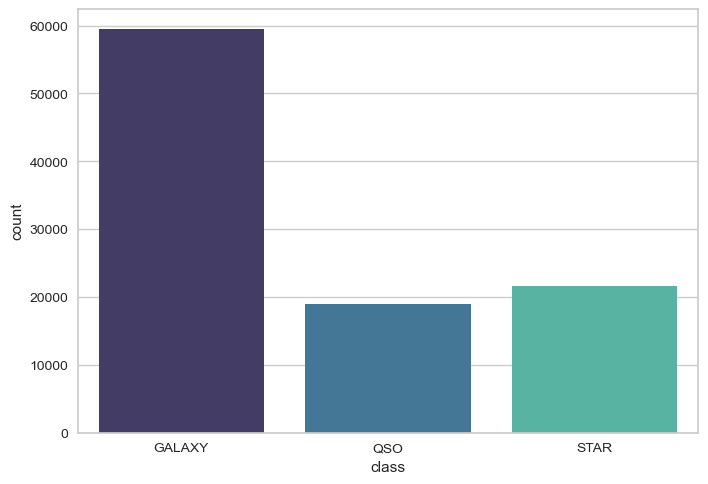

In [9]:
sns.countplot(x ='class', data = df, palette="mako")
plt.show()

Based on the chart, we can notice an imbalance in the number of objects in each class. There are 59,445 objects in the GALAXY class, 18,961 objects in the QSO class, and 21,594 objects in the STAR class. The number of objects in the GALAXY class is more than twice as large as in the other classes, which may affect the result of the classification process. At a later stage, the amount of data should be balanced.

**Boxplots for attributes in each class:**

In [10]:
features_df = df.columns.drop('class')

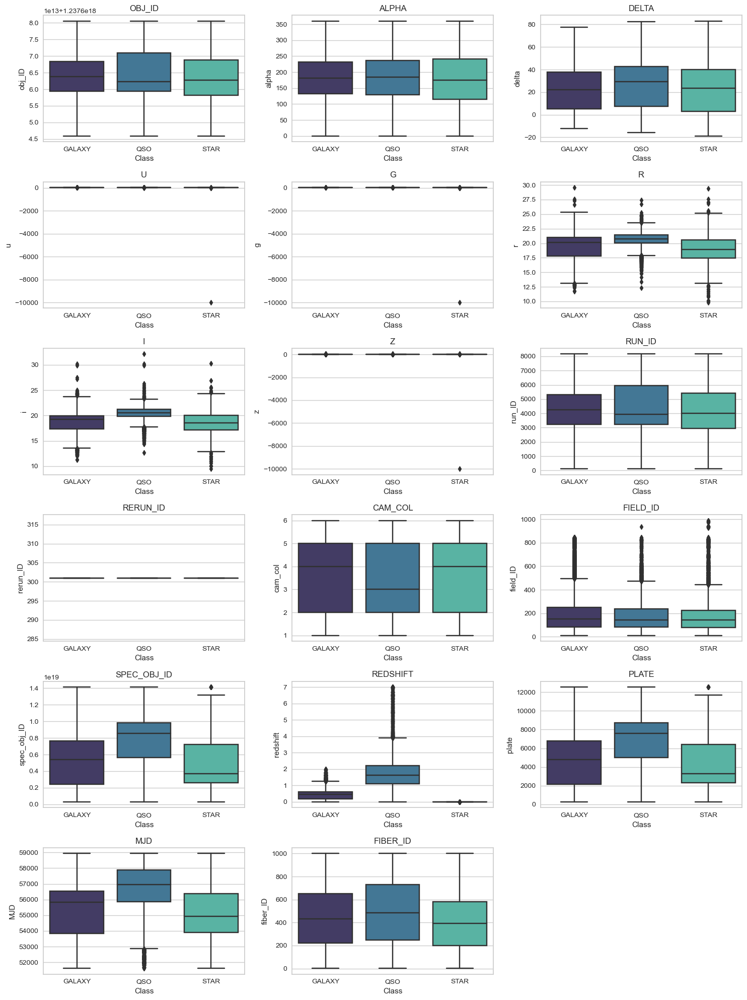

In [12]:
num_plots = len(features_df)
num_cols = 3
num_rows = (num_plots - 1) // num_cols + 1

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 20))

for i, cols in enumerate(features_df):
    row = i // num_cols
    col = i % num_cols
    sns.boxplot(x='class', y=cols, data=df, ax=axes[row, col], palette="mako")
    axes[row, col].set_title(cols.upper())
    axes[row, col].set_xlabel('Class')
    axes[row, col].set_ylabel(cols)

for i in range(len(features_df), num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

Attribute value analysis depending on the classes shows:

* In obj_ID, alpha, delta, and cam_col, values are evenly distributed across all classes.
* For u, g, and z in the STAR class, an outlier significantly affects the scale, making the chart hard to read.
* The average values in the QSO class for plate, spec_obj_ID, fiber_ID, and run_ID are higher compared to other classes. In spec_obj_ID and plate, outliers can be observed above the upper whisker in the STAR class.
* In i and r, QSO class values are also higher, but outliers are present across all classes, most densely near the whiskers.
* field_ID values are similar in each class, with many outliers above the upper whisker, spreading out most in the STAR class.
* The greatest quartile distance in redshift is in the QSO class, with numerous outliers. The GALAXY class distribution is similar to QSO but more "flattened." STAR class values are so small that reading them from the chart is difficult.
* MJD distribution is similar in GALAXY and STAR classes. QSO class values are higher, with many outliers below the lower whisker, which is also higher than in other classes (around 53000, not 52000).
* In rerun_ID, all classes have the same constant value, so this attribute can be omitted.

**Correlation matrix for quantitative attributes:**

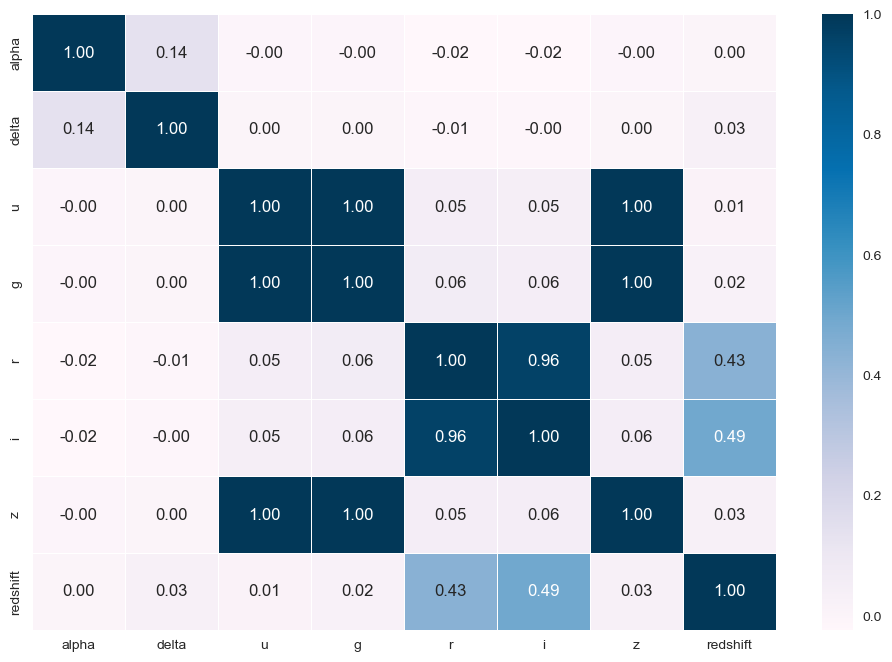

In [13]:
numeric_df = df.copy().drop(columns=['obj_ID', 'run_ID', 'rerun_ID', 'cam_col', 'field_ID', 'spec_obj_ID', 'fiber_ID', 'plate', 'MJD', 'class'])
f,ax = plt.subplots(figsize=(12,8))
sns.heatmap(numeric_df.corr(), cmap="PuBu", annot=True, linewidths=0.5, fmt= '.2f',ax=ax)
plt.show()

* The strongest correlations are observed among **u**, **g**, **r**, **i**, and **z**, indicating that the brightness of objects across different spectral bands is strongly linked. Therefore, if an object is brighter in one band, it is likely to be bright in others. The most correlated filters are:
  * Ultraviolet (u) and green (g)
  * Ultraviolet (u) and infrared (z)
  * Green (g) and infrared (z)
  * Red (r) and near-infrared (i)
* The least correlated filters, showing nearly zero correlation, are:
  * Red (r) and ultraviolet (u)
  * Near-infrared (i) and ultraviolet (u)
  * Near-infrared (i) and green (g)
  * Infrared (z) and near-infrared (i)
  * Infrared (z) and red (r)
  * Green (g) and red (r)
* **Redshift** shows lesser correlation with the red (**r**) and near-infrared (**i**) filters, suggesting that redshift impacts an object's brightness in infrared bands, but the relationship is not very strong.
* **Alpha** and **delta**, which determine an object's position in the sky, have almost zero correlation with all other attributes, indicating no link between an object's position and its features such as brightness or redshift.

C:\Users\sonia\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


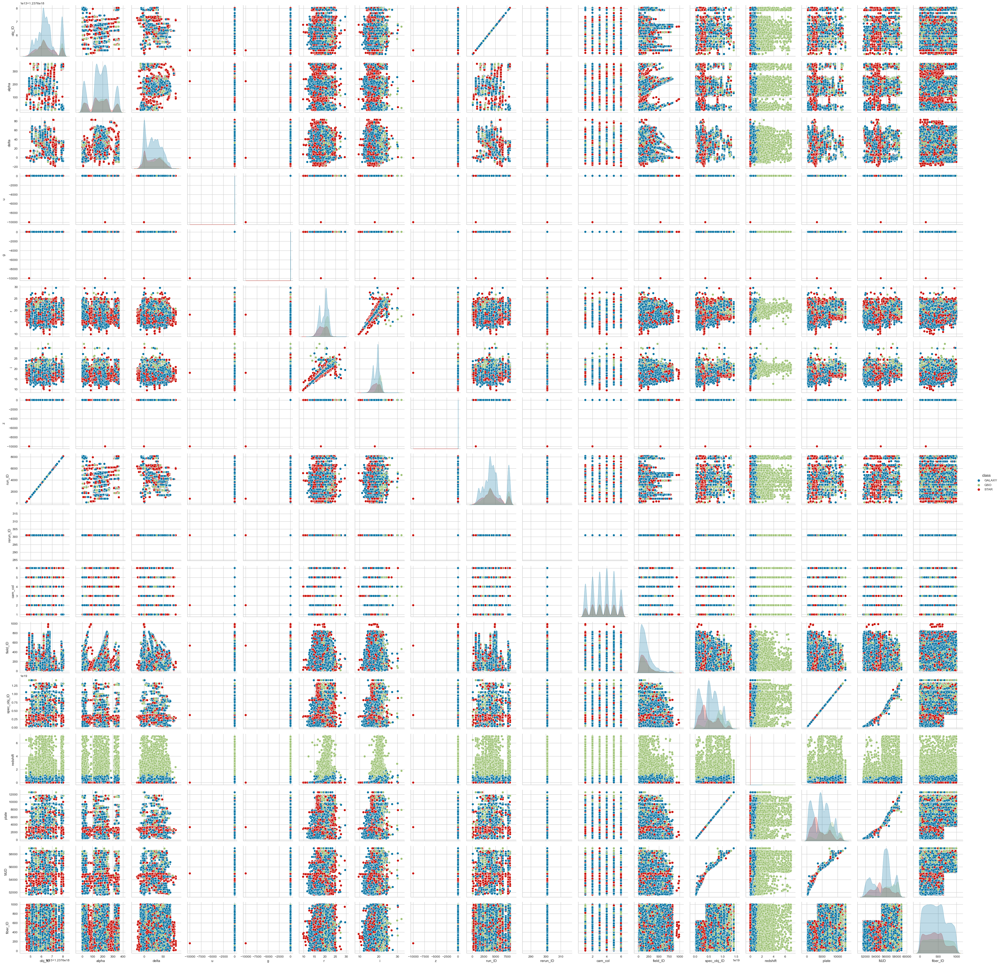

In [14]:
sns.pairplot(df,hue="class")

Analyzing the above pairplot, attention should be paid to the attributes that noticeably allow for the separation of classes:
- The most difficult classes to distinguish are **obj_ID**, **alpha**, **delta**, **run_ID**, **rerun_ID**, **cum_col**, **field_ID**, **fiber_ID**, individual classes overlap in the density charts, there is a common tendency for all classes; in scatter plots, points of objects of different classes are not separated from each other. These attributes can be omitted.
- In **u**, **g** and **z** the graphs are a straight line through the growing value. We need to get rid of this value and then re-analyze these attributes.
- The best distinguishable classes can be seen in **redshift**, in scatter charts the objects of individual classes are noticeably separated from each other.

**Detecting and removing outliers:**

In [3]:
df["class"]=df["class"].map({"GALAXY": 0, "STAR": 1, "QSO": 2})

In [4]:
clf = LocalOutlierFactor()
y_pred = clf.fit_predict(df)
x_score = clf.negative_outlier_factor_
outlier_score = pd.DataFrame()
outlier_score["score"] = x_score

threshold2 = -1.5
filtre2 = outlier_score["score"] < threshold2
outlier_index = outlier_score[filtre2].index.tolist()

We use -1.5 as the threshold because it is a moderately strict threshold. It won't detect all outliers, but there is no big risk of misclassifying normal values as outliers (as would be the case with -2 or -2.5).

Number of objects containing outliers:

In [5]:
len(outlier_index)

15256

We remove them from our dataset:

In [6]:
df.drop(outlier_index, inplace=True)

In [7]:
features_df = df.columns.drop('class')
print("Number of objects in each class:")
print(df.groupby("class").count().T.max())

Number of objects in each class:
class
0    50695
1    17890
2    16159
dtype: int64


Despite the removal of some objects, the proportions of the number of objects in classes are still similar. Class 0 (GALAXY) is still the largest. Class 2 (QSO) is still the least numerous. Removing outliers did not affect these proportions.

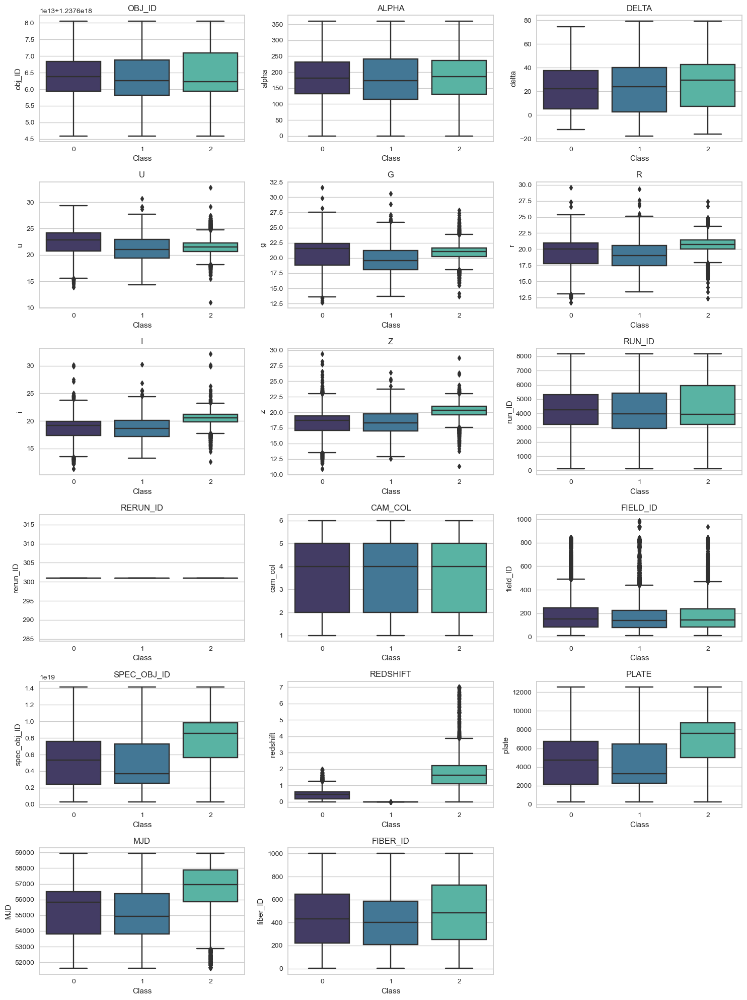

In [27]:
num_plots = len(features_df)
num_cols = 3
num_rows = (num_plots - 1) // num_cols + 1

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 20))

for i, cols in enumerate(features_df):
    row = i // num_cols
    col = i % num_cols
    sns.boxplot(x='class', y=cols, data=df, ax=axes[row, col], palette="mako")
    axes[row, col].set_title(cols.upper())
    axes[row, col].set_xlabel('Class')
    axes[row, col].set_ylabel(cols)

for i in range(len(features_df), num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

After removing objects with outliers, there are definitely fewer of them in the box plots, especially in the charts of the u, g, r, and z attributes. A significant difference is visible in the distribution of the values of the u, g, z attributes, the charts of which were previously unreadable due to the outlier value.
\
There is also a noticeable difference, especially in the redshift class, where the values of this attribute achieved in individual classes have changed. In order to check whether the removal of outliers did not significantly affect the ability to distinguish classes for individual tributes, we will analyze the selected attributes using a pairplot.

In [8]:
df = df.drop(['obj_ID', 'alpha', 'delta', 'run_ID', 'rerun_ID', 'cam_col', 'field_ID', 'fiber_ID'], axis = 1)

C:\Users\sonia\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


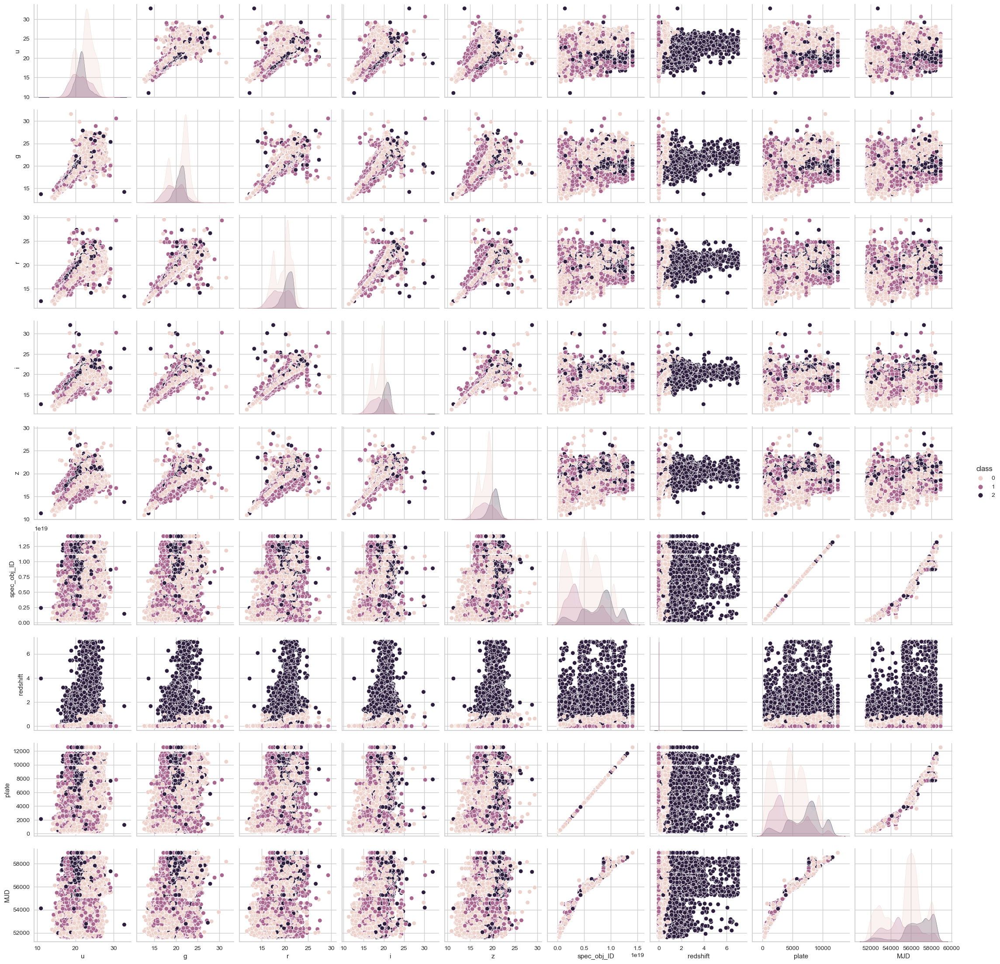

In [29]:
sns.pairplot(df,hue="class")

Analyzing the above pairplot, we can see that:
* The **redshift** attribute is still the best of all attributes for recognizing individual classes. The attribute will be selected for the classification process.
* The **spec_obj_ID** attribute is highly correlated with the **plate** attribute, and there is some correlation with the **MJD** attribute. Therefore, we will leave one of these attributes - **plate**. (**Spec_obj_ID** is also just an object identifying value)
* There is a noticeable correlation between the arguments **u**, **g**, **r**, **i**, **z**, which was justified when analyzing the correlation matrix of quantitative attributes.
* Based on the arguments **u**, **g**, **r**, **i**, **z** there is greater class separation than for the attributes **MJD**, **plate ** and **spec_obj_ID**. These attributes have clear single (maximum double) value peaks, which may suggest that a given class corresponds to objects with specific values. Therefore, we also leave these attributes to the classification process.
* Most attributes show single outliers, but with this number of features, they shouldn't impact the classification process.

In [9]:
df = df.drop(['MJD', 'spec_obj_ID'], axis = 1)

**Data selection**\
Based on the analysis of the above charts and matrices, as well as information about which attributes concern the physical properties of objects, which have the greatest impact on how a given object can be classified, and which are only their identifying values or regarding the properties of the equipment performing measurements for these objects, a selection of the most important attributes for the machine learning process can be made.\
We rejected the following attributes: obj_ID, alpha, delta, run_ID, rerun_ID, cum_col, field_ID, fiber_ID, spec_obj_ID, MJD\
We leave the attributes: u, g, r, i, z, redshift, plate

In [31]:
df

,u,g,r,i,z,class,redshift,plate
0,23.87882,22.27530,20.39501,19.16573,18.79371,0,0.634794,5812
1,24.77759,22.83188,22.58444,21.16812,21.61427,0,0.779136,10445
3,22.13682,23.77656,21.61162,20.50454,19.25010,0,0.932346,9149
4,19.43718,17.58028,16.49747,15.97711,15.54461,0,0.116123,6121
6,21.46973,21.17624,20.92829,20.60826,20.42573,2,0.586455,11069
...,...,...,...,...,...,...,...,...
99994,20.96526,19.81625,19.34186,19.14711,19.05790,0,0.175206,1025
99995,22.16759,22.97586,21.90404,21.30548,20.73569,0,0.000000,9374
99996,22.69118,22.38628,20.45003,19.75759,19.41526,0,0.404895,7626
99997,21.16916,19.26997,18.20428,17.69034,17.35221,0,0.143366,2764


# **Preparing data for the machine learning process**

**Unbalanced data** \
Due to the difference in the number of objects in classes, we use SMOTE - a technique that generates synthetic values for classes with fewer objects. A comparison of the results for data with an unequal number of objects in classes and for data after using SMOTE will be presented.

In [10]:
X = df[['u', 'g', 'r', 'i', 'z', 'redshift', 'plate']]
X

,u,g,r,i,z,redshift,plate
0,23.87882,22.27530,20.39501,19.16573,18.79371,0.634794,5812
1,24.77759,22.83188,22.58444,21.16812,21.61427,0.779136,10445
3,22.13682,23.77656,21.61162,20.50454,19.25010,0.932346,9149
4,19.43718,17.58028,16.49747,15.97711,15.54461,0.116123,6121
6,21.46973,21.17624,20.92829,20.60826,20.42573,0.586455,11069
...,...,...,...,...,...,...,...
99994,20.96526,19.81625,19.34186,19.14711,19.05790,0.175206,1025
99995,22.16759,22.97586,21.90404,21.30548,20.73569,0.000000,9374
99996,22.69118,22.38628,20.45003,19.75759,19.41526,0.404895,7626
99997,21.16916,19.26997,18.20428,17.69034,17.35221,0.143366,2764


In [11]:
y = df['class']
y

0        0
1        0
3        0
4        0
6        2
        ..
99994    0
99995    0
99996    0
99997    0
99999    0
Name: class, Length: 84744, dtype: int64

In [12]:
sm = SMOTE(random_state = 30)
X_res, y_res = sm.fit_resample(X, y)

Number of objects in classes before the process of generating synthetic values:

In [13]:
y.value_counts()

class
0    50695
1    17890
2    16159
Name: count, dtype: int64

Number of objects in classes after the process of generating synthetic values:

In [14]:
y_res.value_counts()

class
0    50695
2    50695
1    50695
Name: count, dtype: int64

**Dividing data sets into training and testing**

In [17]:
X_train_res, X_test_res, y_train_res, y_test_res = train_test_split(X_res, y_res, test_size=0.30, random_state = 30, stratify=y_res)

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state = 30, stratify=y)

# Classifiers

In [15]:
score_df = pd.DataFrame(columns=['Algorithm', 'Result_res', 'Result'])

In [16]:
classes = ['GALAXY','STAR','QSO']

## K-nearest neighbors

We perform modeling both for data with and without artificial sampling:

### Balanced data

First, we analyze the classification results for different k values to find the appropriate number of neighbors. We will present the results in the form of a table.

In [46]:
knn_df_res = pd.DataFrame(columns=['K-neighbours','Result'])

In [47]:
for i in range(1,10):
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(X_train_res, y_train_res)
    y_pred2 = knn.predict(X_test_res)
    knn_df_res = knn_df_res._append({'K-neighbours':i, 'Result':recall_score(y_test_res, y_pred2, average='weighted')}, ignore_index=True)

knn_df_res

,K-neighbours,Result
0,1.0,0.927804
1,2.0,0.910950
2,3.0,0.908890
3,4.0,0.901482
4,5.0,0.896550
5,6.0,0.889339
6,7.0,0.884693
7,8.0,0.880594
8,9.0,0.877592


Based on the table above, we choose k=1 because the best result is achieved for one neighbor.

In [20]:
knn = KNeighborsClassifier(n_neighbors = 1)
knn.fit(X_train_res, y_train_res)
y_pred_res = knn.predict(X_test_res)

knn_res_score = recall_score(y_test_res, y_pred_res, average = 'weighted')
print('Accuracy : %.3f' % (knn_res_score))

Accuracy : 0.928


**Confusion matrix**

C:\Users\sonia\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


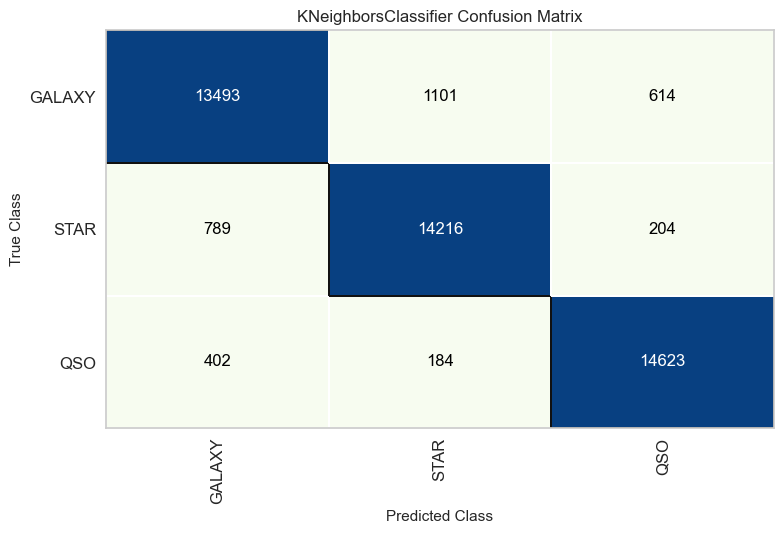

<Axes: title={'center': 'KNeighborsClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [49]:
knn_res_cm = ConfusionMatrix(knn, classes=classes, cmap='GnBu')

knn_res_cm.fit(X_train_res, y_train_res)
knn_res_cm.score(X_test_res, y_test_res)
knn_res_cm.show()

The distribution of errors between classes is approximate. The most correct matches are for quasars and the least for galaxies, but the difference between these values is not large (less than 1000). Once again, galaxies were most often confused with stars, and quasars were least often confused with stars.

### Unbalanced data

In [50]:
knn_df = pd.DataFrame(columns=['K-neighbours','Result'])

In [51]:
for i in range(1,10):
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(X_train, y_train)
    y_pred2 = knn.predict(X_test)
    knn_df = knn_df._append({'K-neighbours':i, 'Result':recall_score(y_test, y_pred2, average='weighted')}, ignore_index=True)

knn_df

,K-neighbours,Result
0,1.0,0.852226
1,2.0,0.841370
2,3.0,0.851715
3,4.0,0.845579
4,5.0,0.845618
5,6.0,0.838853
6,7.0,0.837437
7,8.0,0.831812
8,9.0,0.828941


Based on the table above, we also choose k=1 because the best result is achieved for one neighbor.

In [21]:
knn = KNeighborsClassifier(n_neighbors = 1)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

knn_score = recall_score(y_test, y_pred, average = 'weighted')
print('Accuracy : %.3f' % (knn_score))

Accuracy : 0.852


**Confusion matrix**

C:\Users\sonia\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


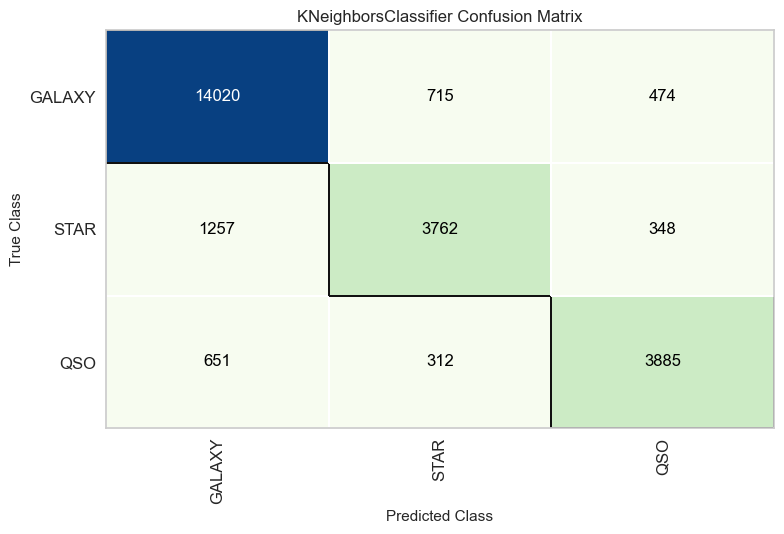

<Axes: title={'center': 'KNeighborsClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [53]:
knn_cm = ConfusionMatrix(knn, classes=classes, cmap='GnBu')

knn_cm.fit(X_train, y_train)
knn_cm.score(X_test, y_test)
knn_cm.show()

For the k-nearest neighbors classifier for balanced data, stars were most often confused with galaxies, and quasars were confused with stars the least often.

In [22]:
score_df = score_df._append({'Algorithm':'KNN', 'Result_res': knn_res_score, 'Result': knn_score}, ignore_index = True)
score_df

,Algorithm,Result_res,Result
0,KNN,0.927804,0.852226


The results achieved for KNN alorithm are better for balanced data than for unbalanced data.

## Decision tree

### Balanced data

In [55]:
dt_df_res = pd.DataFrame(columns=['max_depth','Result'])

In [57]:
for i in range(1,20):
    dt = DecisionTreeClassifier(random_state = 30, max_depth=i)
    dt.fit(X_train_res, y_train_res)
    y_pred2 = dt.predict(X_test_res)
    dt_df_res = dt_df_res._append({'max_depth':i, 'Result':recall_score(y_test_res, y_pred2, average='weighted')}, ignore_index=True)

dt_df_res

,max_depth,Result
0,1.0,0.666681
1,2.0,0.941722
2,3.0,0.941722
3,4.0,0.960965
4,5.0,0.962631
5,6.0,0.967365
6,7.0,0.969732
7,8.0,0.973896
8,9.0,0.974773
9,10.0,0.976066


The best result is achieved for max_depth=13, this value will be accepted.

In [23]:
dt = DecisionTreeClassifier(random_state = 30, max_depth=13)
dt.fit(X_train_res, y_train_res)
y_pred_res = dt.predict(X_test_res)

dt_res_score = recall_score(y_test_res, y_pred_res, average = 'weighted')
print('Accuracy : %.3f' % (dt_res_score))

Accuracy : 0.977


The accuracy of the decision tree is much higher compared to the previous classifier.

**Confusion matrix**

C:\Users\sonia\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


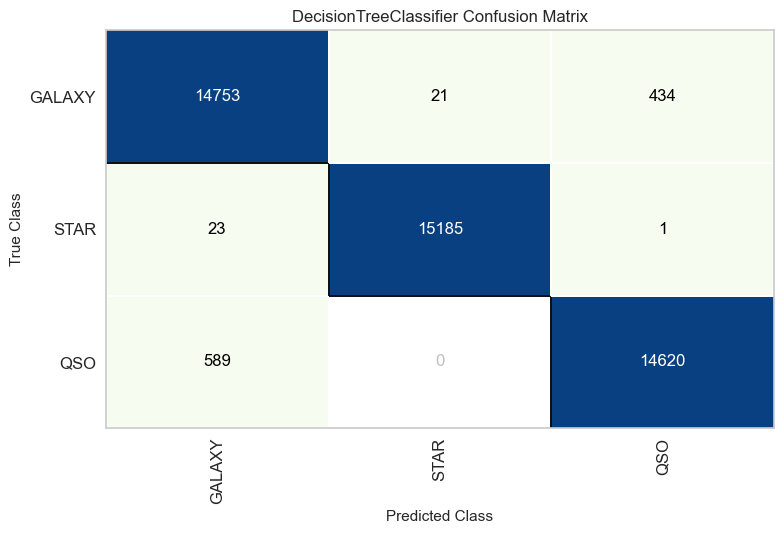

<Axes: title={'center': 'DecisionTreeClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [60]:
dt_res_cm = ConfusionMatrix(dt, classes=classes, cmap='GnBu')

dt_res_cm.fit(X_train_res, y_train_res)
dt_res_cm.score(X_test_res, y_test_res)
dt_res_cm.show()

The number of confusions has noticeably decreased compared to previous classifiers. The most correct matches to the class are for stars and the fewest for quasars. Quasars haven't been confused with stars at all, and the number of confusions between stars and quasars is also close to 0. Quasars were mostly confused with galaxies.

### Unbalanced data


In [61]:
dt_df = pd.DataFrame(columns=['max_depth','Result'])

In [62]:
for i in range(1,20):
    dt = DecisionTreeClassifier(random_state = 30, max_depth=i)
    dt.fit(X_train, y_train)
    y_pred2 = dt.predict(X_test)
    dt_df = dt_df._append({'max_depth':i, 'Result':recall_score(y_test, y_pred2, average='weighted')}, ignore_index=True)

dt_df

,max_depth,Result
0,1.0,0.804633
1,2.0,0.945013
2,3.0,0.948985
3,4.0,0.962791
4,5.0,0.963106
5,6.0,0.965623
6,7.0,0.972900
7,8.0,0.973214
8,9.0,0.974276
9,10.0,0.974316


For the case of unbalanced data, the best result is achieved with max_depth=10.

In [24]:
dt = DecisionTreeClassifier(random_state = 30, max_depth=10)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)

dt_score = recall_score(y_test, y_pred, average = 'weighted')
print('Accuracy : %.3f' % (dt_score))

Accuracy : 0.974


Accuracy for unbalanced data is also high. The difference between the accuracy for balanced and unbalanced data is not as noticeable as in the case of previous classifier, it is less than 1 percentage point.

**Confusion matrix**

C:\Users\sonia\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


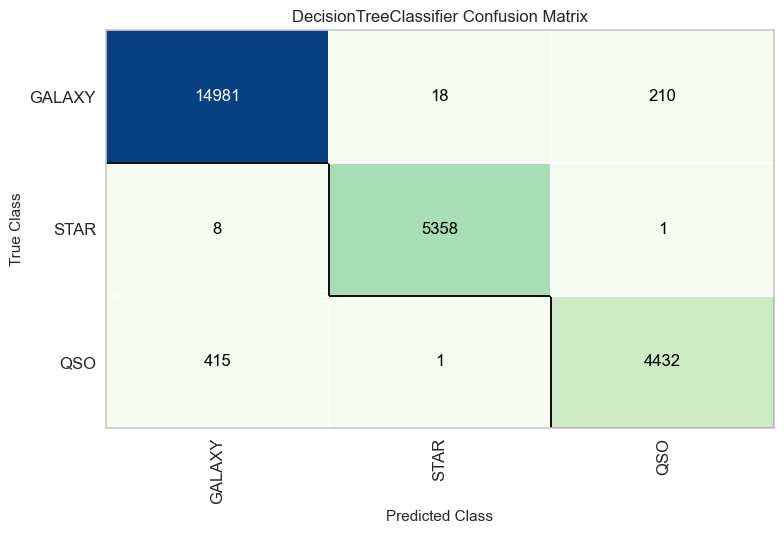

<Axes: title={'center': 'DecisionTreeClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [65]:
dt_cm = ConfusionMatrix(dt, classes=classes, cmap='GnBu')

dt_cm.fit(X_train, y_train)
dt_cm.score(X_test, y_test)
dt_cm.show()

In the case of unbalanced data, the number of errors is also not large. Quasars were most often confused with galaxies, and stars with quasars and quasars with stars were the least likely to be confused.

In [25]:
score_df = score_df._append({'Algorithm':'Decision Tree', 'Result_res': dt_res_score, 'Result': dt_score}, ignore_index = True)
score_df

,Algorithm,Result_res,Result
0,KNN,0.927804,0.852226
1,Decision Tree,0.976592,0.974316


The accuracy results for the decision tree are definietly higher. Also, the difference between the result for balanced data and the result for unbalanced data is smaller (the results differ by only 0.2 percentage points).

## Random Forest Classifier


### Balanced data

In [31]:
rf = RandomForestClassifier()
rf.fit(X_train_res, y_train_res)
y_pred_res = rf.predict(X_test_res)

rf_res_score = recall_score(y_test_res, y_pred_res, average = 'weighted')
print('Accuracy : %.3f' % (rf_res_score))

Accuracy : 0.982


**Confusion matrix**

C:\Users\sonia\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


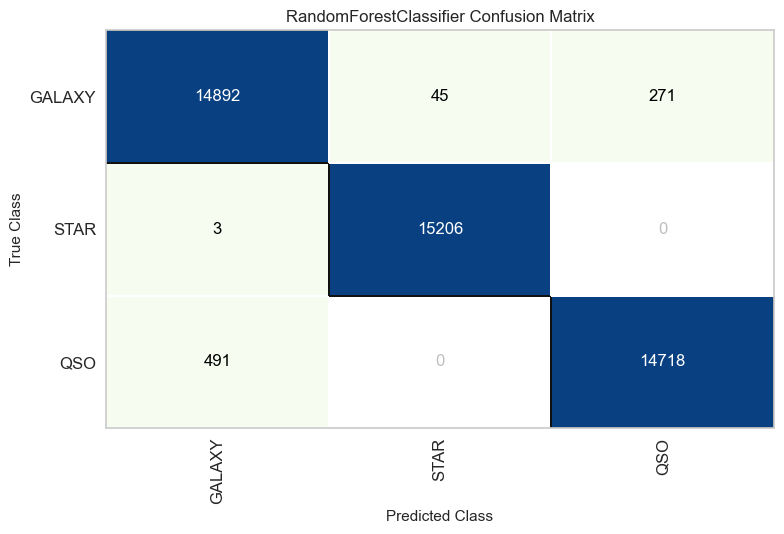

<Axes: title={'center': 'RandomForestClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [32]:
rf_res_cm = ConfusionMatrix(rf, classes=classes, cmap='GnBu')

rf_res_cm.fit(X_train_res, y_train_res)
rf_res_cm.score(X_test_res, y_test_res)
rf_res_cm.show()

This matrix shows that there were no confusions of quasars with stars and stars with quasars. Star class was the class with the biggest number of correct predictions.

### Unbalanced data


In [33]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

rf_score = recall_score(y_test, y_pred, average = 'weighted')
print('Accuracy : %.3f' % (rf_score))

Accuracy : 0.979


**Confusion matrix**

C:\Users\sonia\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


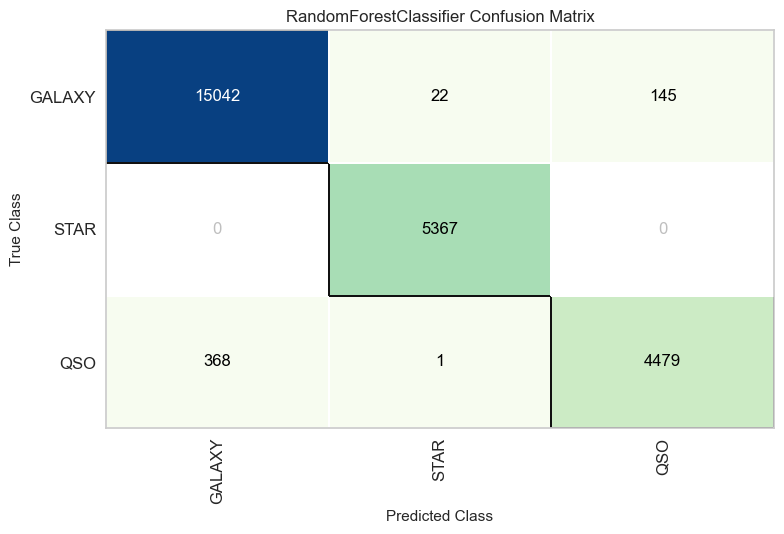

<Axes: title={'center': 'RandomForestClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [35]:
rf_cm = ConfusionMatrix(rf, classes=classes, cmap='GnBu')

rf_cm.fit(X_train, y_train)
rf_cm.score(X_test, y_test)
rf_cm.show()

In the case of unbalanced data, there were no mistakes between stars and galaxies and quasars.

In [36]:
score_df = score_df._append({'Algorithm':'Random Forest', 'Result_res': rf_res_score, 'Result': rf_score}, ignore_index = True)
score_df

,Algorithm,Result_res,Result
0,KNN,0.927804,0.852226
1,Decision Tree,0.976592,0.974316
2,Random Forest,0.982247,0.978918


Random forest classifier has the biggest accuracy of all the classifiers used above.

# Summary

After thorough data analysis and evaluation of various models, an appropriate data classification algorithm can be selected for this data set. In the case of classifying objects into three classes: GALAXY, STAR and QSO, the best algorithm we have tested is the **random forest**. The best result is achieved for SMOTE-balanced data from which outliers have been previously removed, but for the best tested model the difference between the accuracy for balanced and unbalanced data is small. This may indicate that there is no need to artificially sample the data. The random forest model will allow you to predict the class of a new object with high accuracy based on its attributes.